In [1]:
import sys
sys.path.append("../src/models")
sys.path.append("../src")
sys.path.append("../")

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import seaborn as sns
import plotly.graph_objs as go
import plotly.io as pio

In [3]:
from surfactants_cmc import get_train_data, train_model

In [4]:
file_path = '/Users/haoliu/Documents/GitHub/FoundationModel_on_Liposome/data/SurfPro_v1/data/surfpro_literature.csv'
data = pd.read_csv(file_path)
data

,SMILES,Surfactant_Type,CMC,pCMC,AW_ST_CMC,Gamma_max,Area_min,Pi_CMC,pC20,C20,...,SubRef_AW_ST_CMC,Ref_Gamma_max,Ref_Pi_CMC,Ref_Area_min,Ref_pC20,Ref_C20,IUPAC_name,InChI,InChIKey,Molecular_Weight
0,C(=Nc1cc[n+](CCCCCCCCCCCC[n+]2ccc(N=Cc3ccccc3)...,gemini cationic,NaN,NaN,41.0,NaN,NaN,NaN,NaN,NaN,...,10.1007/s11743-013-1478-9,NaN,NaN,NaN,NaN,NaN,NaN,InChI=1S/C36H44N4.2BrH/c1(3-5-7-15-25-39-27-21...,DPTDXTODPMJJNL-UHFFFAOYSA-L,690.193272
1,C(=Nc1cc[n+](CCCCCC[n+]2ccc(N=Cc3ccccc3)cc2)cc...,gemini cationic,NaN,NaN,47.0,NaN,NaN,NaN,NaN,NaN,...,10.1007/s11743-013-1478-9,NaN,NaN,NaN,NaN,NaN,NaN,InChI=1S/C30H32N4.2BrH/c1(9-19-33-21-15-29(16-...,AHXCMXJBNCLAHK-UHFFFAOYSA-L,606.099371
2,C(=Nc1cc[n+](CC[n+]2ccc(N=Cc3ccccc3)cc2)cc1)c1...,gemini cationic,NaN,NaN,50.0,NaN,NaN,NaN,NaN,NaN,...,10.1007/s11743-013-1478-9,NaN,NaN,NaN,NaN,NaN,NaN,InChI=1S/C26H24N4.2BrH/c1-3-7-23(8-4-1)21-27-2...,MVHGWIJZXNNERZ-UHFFFAOYSA-L,550.036771
3,C=CC(=O)OC(C[N+](C)(C)CCCCCCCCCCCC)C[N+](C)(C)...,gemini cationic,0.000790,3.102373,33.4,0.000001,1.12,38.6,3.836155,0.021576,...,10.1016/j.colsurfa.2013.12.079,10.1016/j.colsurfa.2013.12.079,NaN,10.1016/j.colsurfa.2013.12.079,calculated,calculated,"1,3-Bis(N,N-dimethyl-N-dodecylammonium)-2-prop...",InChI=1S/C34H70N2O2.2BrH/c1-8-11-13-15-17-19-2...,ARKWXUQYSTUBMC-UHFFFAOYSA-L,696.380404
4,C=CC(=O)OC(C[N+](C)(C)CCCCCCCCCCCCCC)C[N+](C)(...,gemini cationic,0.000240,3.619789,31.3,0.000001,1.19,40.7,4.483082,0.011299,...,10.1016/j.colsurfa.2013.12.079,10.1016/j.colsurfa.2013.12.079,NaN,10.1016/j.colsurfa.2013.12.079,calculated,calculated,"1,3-Bis(N,N-dimethyl-N-tetradecylammonium)-2-p...",InChI=1S/C38H78N2O2.2BrH/c1-8-11-13-15-17-19-2...,VTTIVKLPSBNYRL-UHFFFAOYSA-L,752.443004
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1619,OCCOCCOCCOCCOCCOCCSCCC(F)(F)C(F)(F)C(F)(F)C(F)...,non-ionic,0.000037,4.432033,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"InChI=1S/C20H29F13O6S/c21-15(22,16(23,24)17(25...",VOCCWGUEVZCMEP-UHFFFAOYSA-N,644.147727
1620,OCCOCCOCCOCCSCCC(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F...,non-ionic,0.000028,4.552997,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,"2-[2-[2-[2-(3,3,4,4,5,5,6,6,7,7,8,8,8-tridecaf...","InChI=1S/C16H21F13O4S/c17-11(18,1-9-34-10-8-33...",HVOWVEVSZCKCCE-UHFFFAOYSA-N,556.095297
1621,OCCOCCOCCSCCC(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F)(F...,non-ionic,0.000025,4.602060,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,"2-[2-[2-(3,3,4,4,5,5,6,6,7,7,8,8,8-tridecafluo...","InChI=1S/C14H17F13O3S/c15-9(16,1-7-31-8-6-30-5...",IOGSRXKLAFCVIR-UHFFFAOYSA-N,512.069082
1622,OCCOCCSCCOCCSCCOCCSCCC(F)(F)C(F)(F)C(F)(F)C(F)...,non-ionic,0.000026,4.585027,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"InChI=1S/C20H29F13O4S3/c21-15(22,16(23,24)17(2...",LPHAEYJKVNLDKF-UHFFFAOYSA-N,676.102039


In [ ]:
# Check if amphiphiles are in the list 

In [25]:
info_path1 = '/Users/haoliu/Documents/Hao/Fordham/Cheminformatics/MD/Amphiphiles/Info.csv'
df_info1 = pd.read_csv(info_path1)

info_path2 = '/Users/haoliu/Documents/Hao/Fordham/Cheminformatics/MD/Amphiphiles/info_new_molecules.csv'
df_info2 = pd.read_csv(info_path2)

In [26]:
df_info2

,ID,Name,Molecular_Formula,InChI,SMILES
0,A1,Decanal,C10H20O,InChI=1S/C10H20O/c1-2-3-4-5-6-7-8-9-10-11/h10H...,CCCCCCCCCC=O
1,A2,Geraniol,C10H18O,"InChI=1S/C10H18O/c1-9(2)5-4-6-10(3)7-8-11/h5,7...",CC(=CCC/C(=C/CO)/C)C
2,A3,Hexadecanoic acid,C16H32O2,InChI=1S/C16H32O2/c1-2-3-4-5-6-7-8-9-10-11-12-...,CCCCCCCCCCCCCCCC(=O)O
3,A4,Myristoleic acid,C14H26O2,InChI=1S/C14H26O2/c1-2-3-4-5-6-7-8-9-10-11-12-...,CCCC/C=C\CCCCCCCC(=O)O
4,A5,Glycine octylester,C10H22ClNO2,InChI=1S/C10H21NO2.ClH/c1-2-3-4-5-6-7-8-13-10(...,CCCCCCCCOC(=O)CN.Cl
5,A6,Perfluorooctanoic acid,C8HF15O2,"InChI=1S/C8HF15O2/c9-2(10,1(24)25)3(11,12)4(13...",C(=O)(C(C(C(C(C(C(C(F)(F)F)(F)F)(F)F)(F)F)(F)F...
6,A7,"1H,1H,2H,2H-Tridecafluorooctane-1-sulphonic acid",C8H5F13O3S,"InChI=1S/C8H5F13O3S/c9-3(10,1-2-25(22,23)24)4(...",C(CS(=O)(=O)O)C(C(C(C(C(C(F)(F)F)(F)F)(F)F)(F)...
7,A8,Heptadecafluorooctanesulfonic acid potassium salt,C8F17KO3S,"InChI=1S/C8HF17O3S.K/c9-1(10,3(13,14)5(17,18)7...",C(C(C(C(C(F)(F)S(=O)(=O)[O-])(F)F)(F)F)(F)F)(C...


In [30]:
df_matched = df_info1[df_info1['InChI'].isin(data['InChI'])].copy()
df_matched

,ID,Name,Molecular_Formula,InChI,SMILES
3,A4,Decyltrimethyl ammonium bromid,C13H30BrN,InChI=1S/C13H30N.BrH/c1-5-6-7-8-9-10-11-12-13-...,CCCCCCCCCC[N+](C)(C)C.[Br-]
4,A5,Decyl sodium sulfate,C10H21NaO4S,InChI=1S/C10H22O4S.Na/c1-2-3-4-5-6-7-8-9-10-14...,CCCCCCCCCCOS(=O)(=O)[O-].[Na+]


In [31]:
df_matched = df_info2[df_info2['InChI'].isin(data['InChI'])].copy()
df_matched

,ID,Name,Molecular_Formula,InChI,SMILES


In [5]:
df_ = data.iloc[:, [0, 1, 3]]
df_cleaned = df_.dropna()
df_data = df_cleaned.reset_index(drop=True)
df_data

,SMILES,Surfactant_Type,pCMC
0,C=CC(=O)OC(C[N+](C)(C)CCCCCCCCCCCC)C[N+](C)(C)...,gemini cationic,3.102373
1,C=CC(=O)OC(C[N+](C)(C)CCCCCCCCCCCCCC)C[N+](C)(...,gemini cationic,3.619789
2,C=CC(=O)OC(C[N+](C)(C)CCCCCCCCCCCCCCCC)C[N+](C...,gemini cationic,4.508638
3,C=CC(=O)OCC[N+](C)(C)CCCCCCCCCCCC.[Br-],cationic,2.384050
4,C=CC(=O)OCC[N+](C)(C)CCCCCCCCCCCCCC.[Br-],cationic,2.899629
...,...,...,...
1390,OCCOCCOCCOCCOCCOCCSCCC(F)(F)C(F)(F)C(F)(F)C(F)...,non-ionic,4.432033
1391,OCCOCCOCCOCCSCCC(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F...,non-ionic,4.552997
1392,OCCOCCOCCSCCC(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F)(F...,non-ionic,4.602060
1393,OCCOCCSCCOCCSCCOCCSCCC(F)(F)C(F)(F)C(F)(F)C(F)...,non-ionic,4.585027


In [6]:
x_emb_frame, df_total = get_train_data(df_data)

Random Seed: 12345
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Vocab size: 2393
[INFERENCE MODE - smi-ted-Light]


/Users/haoliu/anaconda3/envs/chemprop/lib/python3.11/site-packages/numpy/_core/fromnumeric.py:57: FutureWarning: 'Series.swapaxes' is deprecated and will be removed in a future version. Please use 'Series.transpose' instead.
  return bound(*args, **kwds)
100%|██████████| 13/13 [00:32<00:00,  2.53s/it]


Train size: (1116, 770)
Test size: (279, 770)
Surfactant_Type
gemini cationic          398
non-ionic                225
anionic                  191
cationic                 189
sugar-based non-ionic     80
zwitterionic              17
gemini zwitterionic       14
gemini anionic             2
Name: count, dtype: int64
Surfactant_Type
gemini cationic          99
non-ionic                56
anionic                  48
cationic                 48
sugar-based non-ionic    20
zwitterionic              4
gemini zwitterionic       3
gemini anionic            1
Name: count, dtype: int64
RMSE score : 0.5195861994353487
R2 score : 0.7564225383257583


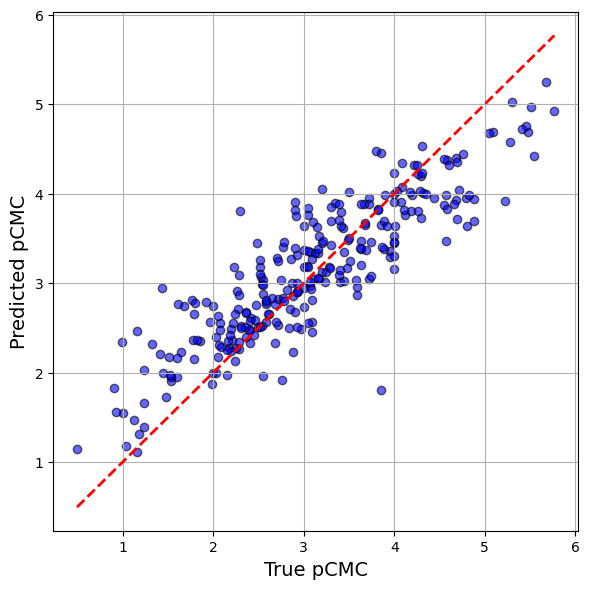

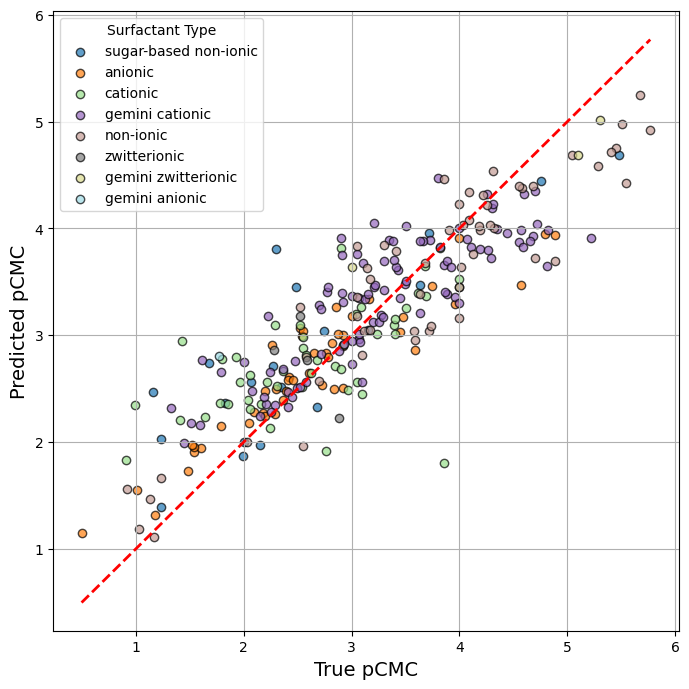

In [7]:
model, RMSE, r2, train_df, test_df = train_model(df_total, property='pCMC')

In [ ]:
# Interpretability

In [12]:
df_total

,0,1,2,3,4,5,6,7,8,9,...,760,761,762,763,764,765,766,767,Surfactant_Type,pCMC
0,0.316224,-0.607016,0.064007,0.354682,0.612596,-0.583472,1.157591,0.100974,0.906317,0.178776,...,0.311829,0.328249,-0.649204,0.578091,-0.659988,0.659678,0.592834,-0.139048,gemini cationic,3.102373
1,0.297257,-0.590087,0.063313,0.340966,0.614565,-0.582135,1.148290,0.124246,0.887901,0.178734,...,0.312845,0.323760,-0.633981,0.575165,-0.665397,0.660196,0.565780,-0.146689,gemini cationic,3.619789
2,0.277743,-0.600162,0.082801,0.329802,0.629946,-0.573500,1.142581,0.116861,0.890986,0.184743,...,0.294953,0.322267,-0.630359,0.588270,-0.681033,0.662238,0.552585,-0.167076,gemini cationic,4.508638
3,0.294121,-0.594994,0.091799,0.375703,0.582878,-0.601765,1.212082,0.121437,0.884056,0.222603,...,0.301488,0.339867,-0.607772,0.561617,-0.640617,0.744401,0.601170,-0.090645,cationic,2.384050
4,0.292429,-0.588739,0.085767,0.366590,0.594064,-0.600268,1.213634,0.117407,0.883085,0.218156,...,0.300876,0.347810,-0.608051,0.563517,-0.646699,0.733216,0.594791,-0.104502,cationic,2.899629
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1390,0.315429,-0.428648,0.139677,0.349758,0.542107,-0.631468,1.011472,0.152829,0.898131,0.115644,...,0.112387,0.298349,-0.526001,0.541865,-0.801553,0.717981,0.545537,-0.192814,non-ionic,4.432033
1391,0.328160,-0.447582,0.114976,0.365660,0.546039,-0.619756,1.019459,0.153338,0.893852,0.115630,...,0.131880,0.323831,-0.526206,0.549387,-0.803292,0.736138,0.514282,-0.172097,non-ionic,4.552997
1392,0.342262,-0.434655,0.129962,0.373835,0.559745,-0.622220,1.002394,0.152475,0.895084,0.096613,...,0.119885,0.321903,-0.519230,0.551452,-0.795658,0.729936,0.516836,-0.160247,non-ionic,4.602060
1393,0.342196,-0.449891,0.133653,0.351344,0.523874,-0.641626,1.041021,0.162885,0.887348,0.096127,...,0.112721,0.291464,-0.574533,0.558885,-0.812907,0.719481,0.592681,-0.187548,non-ionic,4.585027


In [9]:
df_total.to_csv('df_total_surfactants_smi-ted_20250709.csv', index=False)

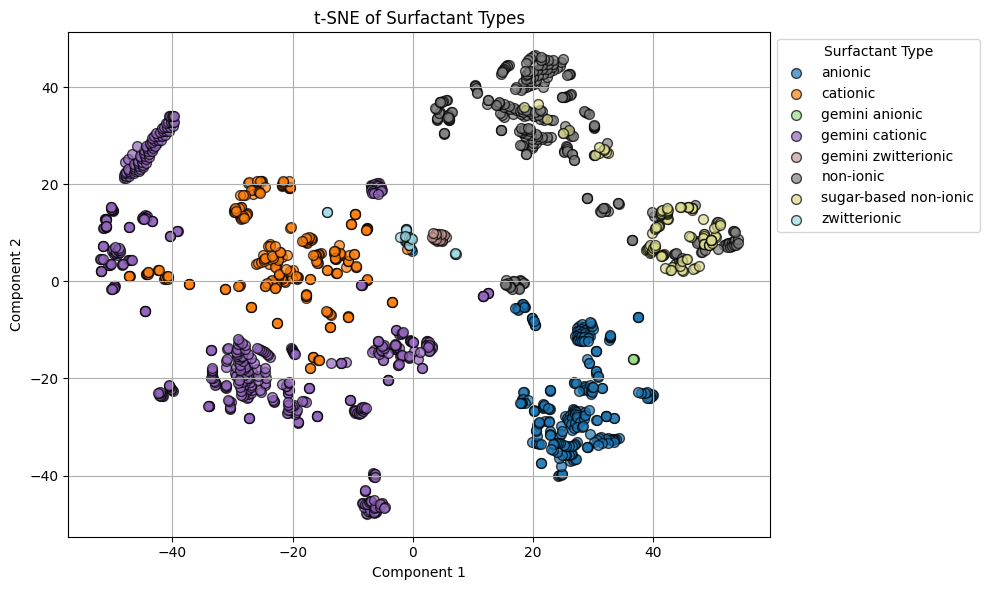

In [15]:
# 1. Prepare input and labels
X = df_total.iloc[:, :768].values
y = df_total['Surfactant_Type'].values

# 2. Create color dictionary
surfactant_types = np.unique(y)
colors = plt.cm.tab20(np.linspace(0, 1, len(surfactant_types)))
color_dict = dict(zip(surfactant_types, colors))

# 3. Choose dimension reduction method
reducer = TSNE(n_components=2, random_state=42)  # or PCA(n_components=2)
X_reduced = reducer.fit_transform(X)

# 4. Plot
plt.figure(figsize=(10,6))
for surfactant in surfactant_types:
    idx = (y == surfactant)
    plt.scatter(X_reduced[idx, 0], X_reduced[idx, 1], 
                color=color_dict[surfactant], 
                label=surfactant, 
                alpha=0.7, edgecolor='k', s=50)

plt.legend(title='Surfactant Type', loc='best', frameon=True, bbox_to_anchor=(1, 1))
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('t-SNE of Surfactant Types')
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# 3D

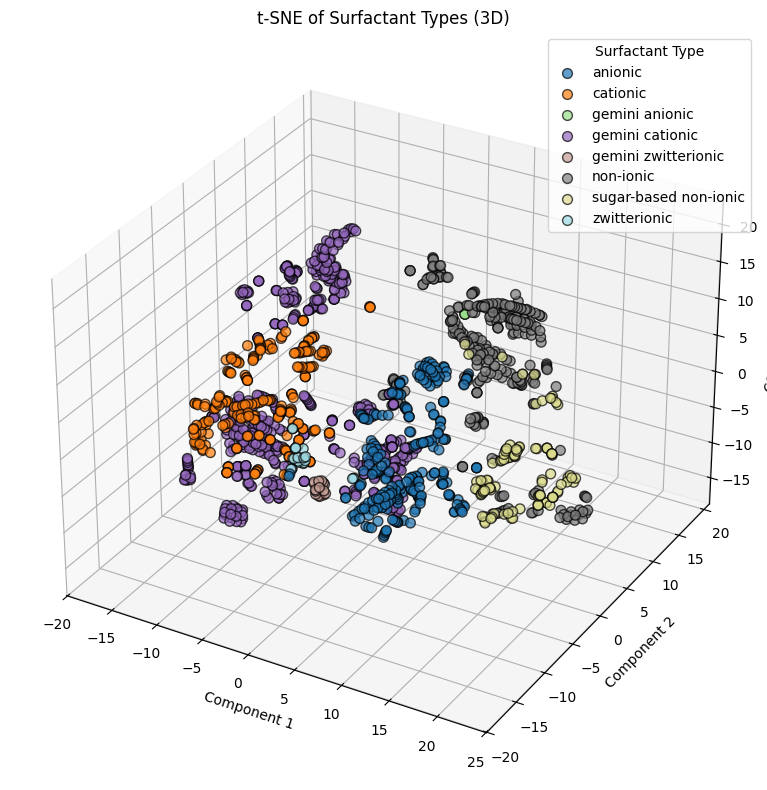

In [18]:
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D

# 1. Prepare input and labels (already done)
# X = df_total.iloc[:, :768].values
# y = df_total['Surfactant_Type'].values

# 2. Choose 3D dimension reduction
reducer = TSNE(n_components=3, random_state=42)  # or PCA(n_components=3)
X_reduced = reducer.fit_transform(X)

# 3. 3D Plot
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')

for surfactant in surfactant_types:
    idx = (y == surfactant)
    ax.scatter(X_reduced[idx, 0], X_reduced[idx, 1], X_reduced[idx, 2], 
               color=color_dict[surfactant], 
               label=surfactant, 
               alpha=0.7, edgecolor='k', s=50)

ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 3')
ax.set_title('t-SNE of Surfactant Types (3D)')
ax.legend(title='Surfactant Type', loc='best', frameon=True)
plt.tight_layout()
plt.show()


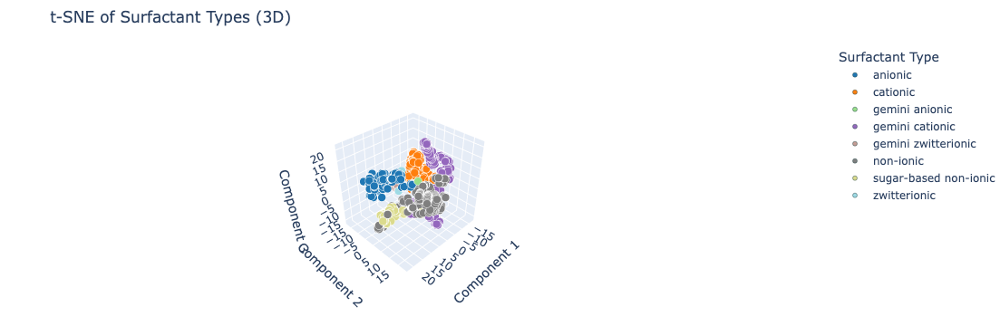

In [19]:
import plotly.graph_objs as go
import plotly.io as pio

# 1. Prepare input and labels (already done)
# X = df_total.iloc[:, :768].values
# y = df_total['Surfactant_Type'].values

# 2. Choose 3D dimension reduction
reducer = TSNE(n_components=3, random_state=42)  # or PCA(n_components=3)
X_reduced = reducer.fit_transform(X)

# 3. Create Plotly traces
traces = []
for surfactant in surfactant_types:
    idx = (y == surfactant)
    trace = go.Scatter3d(
        x=X_reduced[idx, 0],
        y=X_reduced[idx, 1],
        z=X_reduced[idx, 2],
        mode='markers',
        marker=dict(
            size=5,
            color=f'rgb({color_dict[surfactant][0]*255},{color_dict[surfactant][1]*255},{color_dict[surfactant][2]*255})',
            line=dict(width=0.5, color='DarkSlateGrey')
        ),
        name=surfactant
    )
    traces.append(trace)

# 4. Layout
layout = go.Layout(
    title='t-SNE of Surfactant Types (3D)',
    scene=dict(
        xaxis_title='Component 1',
        yaxis_title='Component 2',
        zaxis_title='Component 3'
    ),
    legend=dict(title='Surfactant Type'),
    margin=dict(l=0, r=0, b=0, t=50)
)

fig = go.Figure(data=traces, layout=layout)
pio.show(fig)


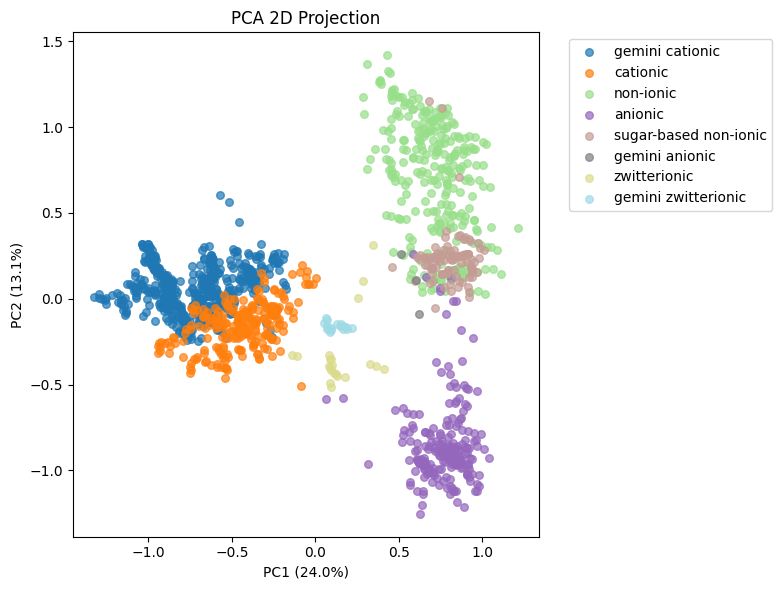

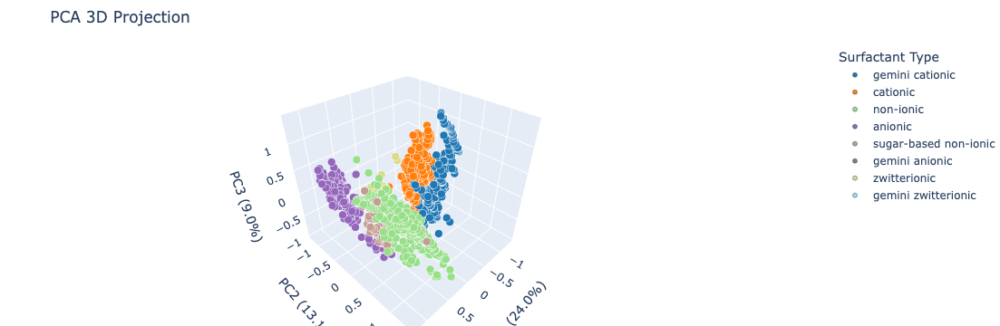

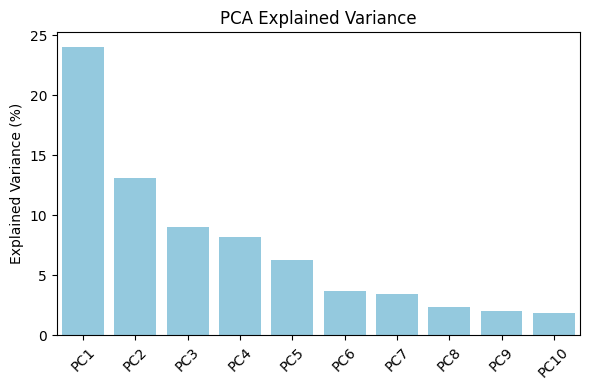

In [21]:
# 1. Prepare X and y
X = df_total.iloc[:, :768].values
y = df_total['Surfactant_Type'].values

# 2. PCA
pca = PCA(n_components=10)  # more components to see variance
X_pca = pca.fit_transform(X)

explained_variance = pca.explained_variance_ratio_

# 3. Color mapping
surfactant_types = df_total['Surfactant_Type'].unique()
colors = plt.cm.tab20(np.linspace(0, 1, len(surfactant_types)))
color_dict = dict(zip(surfactant_types, colors))

# 4. 2D Scatter Plot
plt.figure(figsize=(8,6))
for surfactant in surfactant_types:
    idx = (y == surfactant)
    plt.scatter(X_pca[idx, 0], X_pca[idx, 1], 
                color=color_dict[surfactant], 
                label=surfactant, alpha=0.7, s=30)

plt.xlabel(f"PC1 ({explained_variance[0]*100:.1f}%)")
plt.ylabel(f"PC2 ({explained_variance[1]*100:.1f}%)")
plt.title('PCA 2D Projection')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# 5. 3D Interactive Scatter Plot
traces = []
for surfactant in surfactant_types:
    idx = (y == surfactant)
    trace = go.Scatter3d(
        x=X_pca[idx, 0],
        y=X_pca[idx, 1],
        z=X_pca[idx, 2],
        mode='markers',
        marker=dict(
            size=5,
            color=f'rgb({color_dict[surfactant][0]*255},{color_dict[surfactant][1]*255},{color_dict[surfactant][2]*255})',
            line=dict(width=0.5, color='DarkSlateGrey')
        ),
        name=surfactant
    )
    traces.append(trace)

layout = go.Layout(
    title='PCA 3D Projection',
    scene=dict(
        xaxis_title=f'PC1 ({explained_variance[0]*100:.1f}%)',
        yaxis_title=f'PC2 ({explained_variance[1]*100:.1f}%)',
        zaxis_title=f'PC3 ({explained_variance[2]*100:.1f}%)'
    ),
    margin=dict(l=0, r=0, b=0, t=50),
    legend=dict(title='Surfactant Type')
)

fig = go.Figure(data=traces, layout=layout)
pio.show(fig)

# 6. Explained Variance Plot
plt.figure(figsize=(6,4))
sns.barplot(x=[f'PC{i+1}' for i in range(10)], y=explained_variance*100, color='skyblue')
plt.ylabel('Explained Variance (%)')
plt.title('PCA Explained Variance')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [22]:
explained_variance

array([0.24049784, 0.13062745, 0.09035189, 0.08212657, 0.06279694,
       0.03687264, 0.03409953, 0.02306458, 0.02022298, 0.01880322],
      dtype=float32)

In [23]:
# What features drives the seperation, PCA loading plot
# Calculate descriptors correlated to PCs?

In [32]:
model

TransformedTargetRegressor(regressor=RandomForestRegressor(random_state=42),
                           transformer=MinMaxScaler(feature_range=(-1, 1)))

In [33]:
import pickle

filename = 'regression_model_surfactants.pkl'
with open(filename, 'wb') as file:
    pickle.dump(model, file)

### Testing on new amphiphiles

In [41]:
from models.smi_ted.smi_ted_light.load import load_smi_ted
import torch

def get_train_data_new(df_data):
    train_smiles_list = df_data['SMILES']
    model_SMI = load_smi_ted(folder='../models/smi_ted/smi_ted_light', ckpt_filename='smi-ted-Light_40.pt')

    return_tensor=True
    with torch.no_grad():
        x_emb = model_SMI.encode(train_smiles_list, return_torch=return_tensor)

    x_emb_array  = x_emb.numpy()
    x_emb_frame = pd.DataFrame(x_emb_array)

    df_total = pd.concat([x_emb_frame, df_data.iloc[:,:]], axis=1)

    return x_emb_frame, df_total

In [42]:
x_emb_frame1, df_total1 = get_train_data_new(df_info1)

Random Seed: 12345
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding


/Users/haoliu/anaconda3/envs/fm4m/lib/python3.9/site-packages/numpy/core/fromnumeric.py:59: FutureWarning:

'Series.swapaxes' is deprecated and will be removed in a future version. Please use 'Series.transpose' instead.



Vocab size: 2393
[INFERENCE MODE - smi-ted-Light]


100%|██████████| 7/7 [00:00<00:00, 35.96it/s]


In [43]:
x_emb_frame2, df_total2 = get_train_data_new(df_info2)

Random Seed: 12345
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding


/Users/haoliu/anaconda3/envs/fm4m/lib/python3.9/site-packages/numpy/core/fromnumeric.py:59: FutureWarning:

'Series.swapaxes' is deprecated and will be removed in a future version. Please use 'Series.transpose' instead.



Vocab size: 2393
[INFERENCE MODE - smi-ted-Light]


100%|██████████| 8/8 [00:00<00:00, 37.26it/s]


In [47]:
test_x1 = df_total1.iloc[:, 0:768]
test_x2 = df_total2.iloc[:, 0:768]

pred_y1 = model.predict(test_x1)
pred_y2 = model.predict(test_x2)

In [48]:
pred_y1

array([2.37591406, 2.38478971, 2.49036888, 2.21425923, 1.72487467,
       2.65394847, 2.83289855])

In [49]:
pred_y2

array([2.90283992, 2.91257053, 3.82974535, 3.748214  , 1.73909002,
       2.6662752 , 3.29666694, 2.52459809])

In [51]:
df_new1 = df_total1.iloc[:, 768:].copy()
df_new2 = df_total2.iloc[:, 768:].copy()

In [52]:
df_new1['pCMC'] = pred_y1
df_new2['pCMC'] = pred_y2

In [53]:
df_new1

,ID,Name,Molecular_Formula,InChI,SMILES,pCMC
0,A1,Decanoic acid,C10H20O2,InChI=1S/C10H20O2/c1-2-3-4-5-6-7-8-9-10(11)12/...,CCCCCCCCCC(=O)O,2.375914
1,A2,Decanoate,C10H19O2-,InChI=1S/C10H20O2/c1-2-3-4-5-6-7-8-9-10(11)12/...,CCCCCCCCCC(=O)[O-],2.384790
2,A3,Decylamine,C10H23N,InChI=1S/C10H23N/c1-2-3-4-5-6-7-8-9-10-11/h2-1...,CCCCCCCCCCN,2.490369
3,A4,Decyltrimethyl ammonium bromid,C13H30BrN,InChI=1S/C13H30N.BrH/c1-5-6-7-8-9-10-11-12-13-...,CCCCCCCCCC[N+](C)(C)C.[Br-],2.214259
4,A5,Decyl sodium sulfate,C10H21NaO4S,InChI=1S/C10H22O4S.Na/c1-2-3-4-5-6-7-8-9-10-14...,CCCCCCCCCCOS(=O)(=O)[O-].[Na+],1.724875
5,A6,Decanol,C10H22O,InChI=1S/C10H22O/c1-2-3-4-5-6-7-8-9-10-11/h11H...,CCCCCCCCCCO,2.653948
6,A7,Glycerol monodecanoate,C13H26O4,InChI=1S/C13H26O4/c1-2-3-4-5-6-7-8-9-13(16)17-...,CCCCCCCCCC(=O)OCC(CO)O,2.832899


In [60]:
df_new2

,ID,Name,Molecular_Formula,InChI,SMILES,pCMC
0,A1,Decanal,C10H20O,InChI=1S/C10H20O/c1-2-3-4-5-6-7-8-9-10-11/h10H...,CCCCCCCCCC=O,2.902840
1,A2,Geraniol,C10H18O,"InChI=1S/C10H18O/c1-9(2)5-4-6-10(3)7-8-11/h5,7...",CC(=CCC/C(=C/CO)/C)C,2.912571
2,A3,Hexadecanoic acid,C16H32O2,InChI=1S/C16H32O2/c1-2-3-4-5-6-7-8-9-10-11-12-...,CCCCCCCCCCCCCCCC(=O)O,3.829745
3,A4,Myristoleic acid,C14H26O2,InChI=1S/C14H26O2/c1-2-3-4-5-6-7-8-9-10-11-12-...,CCCC/C=C\CCCCCCCC(=O)O,3.748214
4,A5,Glycine octylester,C10H22ClNO2,InChI=1S/C10H21NO2.ClH/c1-2-3-4-5-6-7-8-13-10(...,CCCCCCCCOC(=O)CN.Cl,1.739090
5,A6,Perfluorooctanoic acid,C8HF15O2,"InChI=1S/C8HF15O2/c9-2(10,1(24)25)3(11,12)4(13...",C(=O)(C(C(C(C(C(C(C(F)(F)F)(F)F)(F)F)(F)F)(F)F...,2.666275
6,A7,"1H,1H,2H,2H-Tridecafluorooctane-1-sulphonic acid",C8H5F13O3S,"InChI=1S/C8H5F13O3S/c9-3(10,1-2-25(22,23)24)4(...",C(CS(=O)(=O)O)C(C(C(C(C(C(F)(F)F)(F)F)(F)F)(F)...,3.296667
7,A8,Heptadecafluorooctanesulfonic acid potassium salt,C8F17KO3S,"InChI=1S/C8HF17O3S.K/c9-1(10,3(13,14)5(17,18)7...",C(C(C(C(C(F)(F)S(=O)(=O)[O-])(F)F)(F)F)(F)F)(C...,2.524598


In [69]:
df_new1.to_csv('Info_pCMC.csv',index=False)
df_new2.to_csv('Info_new_molecules_pCMC.csv',index=False)

In [55]:
df_new1.columns

Index(['ID', 'Name', 'Molecular_Formula', 'InChI', 'SMILES', 'pCMC'], dtype='object')

In [56]:
df_new1['InChI'].values

array(['InChI=1S/C10H20O2/c1-2-3-4-5-6-7-8-9-10(11)12/h2-9H2,1H3,(H,11,12)',
       'InChI=1S/C10H20O2/c1-2-3-4-5-6-7-8-9-10(11)12/h2-9H2,1H3,(H,11,12)/p-1',
       'InChI=1S/C10H23N/c1-2-3-4-5-6-7-8-9-10-11/h2-11H2,1H3',
       'InChI=1S/C13H30N.BrH/c1-5-6-7-8-9-10-11-12-13-14(2,3)4;/h5-13H2,1-4H3;1H/q+1;/p-1',
       'InChI=1S/C10H22O4S.Na/c1-2-3-4-5-6-7-8-9-10-14-15(11,12)13;/h2-10H2,1H3,(H,11,12,13);/q;+1/p-1',
       'InChI=1S/C10H22O/c1-2-3-4-5-6-7-8-9-10-11/h11H,2-10H2,1H3',
       'InChI=1S/C13H26O4/c1-2-3-4-5-6-7-8-9-13(16)17-11-12(15)10-14/h12,14-15H,2-11H2,1H3'],
      dtype=object)

In [58]:
# True values:
data[data['InChI']== 'InChI=1S/C13H30N.BrH/c1-5-6-7-8-9-10-11-12-13-14(2,3)4;/h5-13H2,1-4H3;1H/q+1;/p-1']

,SMILES,Surfactant_Type,CMC,pCMC,AW_ST_CMC,Gamma_max,Area_min,Pi_CMC,pC20,C20,...,SubRef_AW_ST_CMC,Ref_Gamma_max,Ref_Pi_CMC,Ref_Area_min,Ref_pC20,Ref_C20,IUPAC_name,InChI,InChIKey,Molecular_Weight
1230,CCCCCCCCCC[N+](C)(C)C.[Br-],cationic,0.00476,2.322393,36.2,0.000003,0.55,35.77,2.780595,0.062002,...,10.1021/je201107a,10.1016/j.colsurfa.2014.06.019,calculated,10.1016/j.colsurfa.2014.06.019,calculated,calculated,decyl(trimethyl)ammonium-bromide,InChI=1S/C13H30N.BrH/c1-5-6-7-8-9-10-11-12-13-...,PLMFYJJFUUUCRZ-UHFFFAOYSA-M,279.156162


In [59]:
data[data['InChI']== 'InChI=1S/C10H22O4S.Na/c1-2-3-4-5-6-7-8-9-10-14-15(11,12)13;/h2-10H2,1H3,(H,11,12,13);/q;+1/p-1']

,SMILES,Surfactant_Type,CMC,pCMC,AW_ST_CMC,Gamma_max,Area_min,Pi_CMC,pC20,C20,...,SubRef_AW_ST_CMC,Ref_Gamma_max,Ref_Pi_CMC,Ref_Area_min,Ref_pC20,Ref_C20,IUPAC_name,InChI,InChIKey,Molecular_Weight
1214,CCCCCCCCCCOS(=O)(=O)[O-].[Na+],anionic,0.03304,1.48096,NaN,5.340000e-07,3.11,NaN,NaN,NaN,...,NaN,NaN,NaN,10.1081/DIS-120014014,NaN,NaN,sodium-decylsulfate,InChI=1S/C10H22O4S.Na/c1-2-3-4-5-6-7-8-9-10-14...,XZTJQQLJJCXOLP-UHFFFAOYSA-M,260.105824


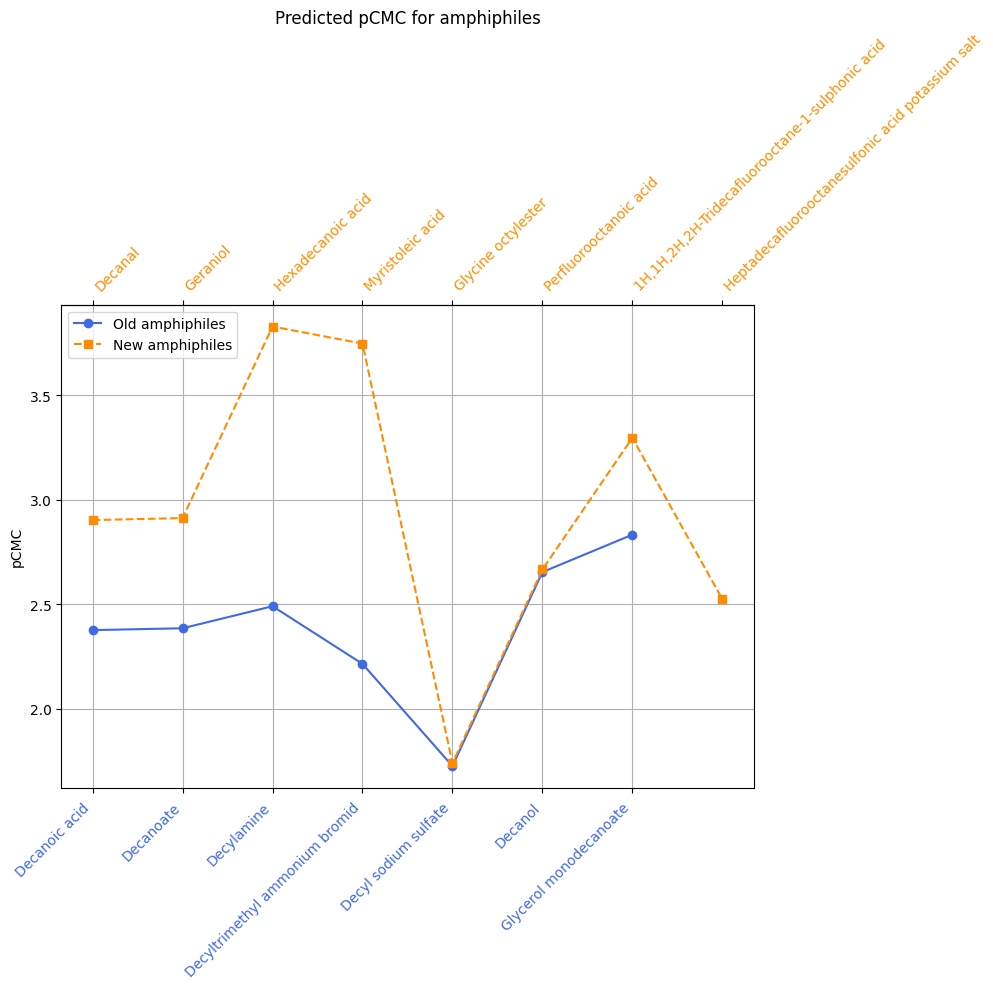

In [68]:
# Prepare x positions
x1 = np.arange(len(df_new1))
x2 = np.arange(len(df_new2))

# Create figure and axis
fig, ax = plt.subplots(figsize=(10, 10))

# Plot both datasets
ax.plot(x1, df_new1['pCMC'], marker='o', label='Old amphiphiles', color='royalblue', linestyle='-')
ax.plot(x2, df_new2['pCMC'], marker='s', label='New amphiphiles', color='darkorange', linestyle='--')

# Bottom x-ticks (df_new1)
ax.set_xticks(x1)
ax.set_xticklabels(df_new1['Name'], rotation=45, ha='right',color='royalblue')
ax.tick_params(axis='x', which='both', direction='out', pad=5)

# Create top x-axis for df_new2
ax_top = ax.secondary_xaxis('top')
ax_top.set_xticks(x2)
ax_top.set_xticklabels(df_new2['Name'], rotation=45, ha='left', color='darkorange')
ax_top.tick_params(axis='x', which='both', direction='out', pad=5)

# Labels and title
ax.set_ylabel('pCMC')
ax.set_title('Predicted pCMC for amphiphiles')
ax.legend(loc='upper left')
ax.grid(True)
plt.tight_layout()
plt.show()


In [70]:
# Check the the distribution of training data set

In [77]:
train_df.index

Index([ 835,  616, 1296,  403, 1270, 1344,  231,  745,  429, 1074,
       ...
        943,   41,  349,   45,   12,   76, 1193,  695,  280,  706],
      dtype='int64', length=1116)

In [78]:
train_df.index.values

array([ 835,  616, 1296, ...,  695,  280,  706])

In [80]:
np.save('train_index_surfactants_20250516.npy', train_df.index.values)

In [81]:
df_data

,SMILES,Surfactant_Type,pCMC
0,C=CC(=O)OC(C[N+](C)(C)CCCCCCCCCCCC)C[N+](C)(C)...,gemini cationic,3.102373
1,C=CC(=O)OC(C[N+](C)(C)CCCCCCCCCCCCCC)C[N+](C)(...,gemini cationic,3.619789
2,C=CC(=O)OC(C[N+](C)(C)CCCCCCCCCCCCCCCC)C[N+](C...,gemini cationic,4.508638
3,C=CC(=O)OCC[N+](C)(C)CCCCCCCCCCCC.[Br-],cationic,2.384050
4,C=CC(=O)OCC[N+](C)(C)CCCCCCCCCCCCCC.[Br-],cationic,2.899629
...,...,...,...
1390,OCCOCCOCCOCCOCCOCCSCCC(F)(F)C(F)(F)C(F)(F)C(F)...,non-ionic,4.432033
1391,OCCOCCOCCOCCSCCC(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F...,non-ionic,4.552997
1392,OCCOCCOCCSCCC(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F)(F...,non-ionic,4.602060
1393,OCCOCCSCCOCCSCCOCCSCCC(F)(F)C(F)(F)C(F)(F)C(F)...,non-ionic,4.585027


In [83]:
train_df_ori = df_data.loc[train_df.index]
train_df_ori

,SMILES,Surfactant_Type,pCMC
835,CCCCCCCCCCCC[N+](C)(C)CC(O)CN(CCCC)CC(O)C[N+](...,gemini cationic,3.251037
616,CCCCCCCCCCCCCC[N+](C)(C)CC(=O)[O-],zwitterionic,3.657577
1296,CCCCCc1ccc(C[C@H](Nc2ccc(S(=O)(=O)[O-])cc2)C(=...,anionic,1.853872
403,CCCCCCCCCCCCCCCCCCOCCOCCOCCOCCOCCOCCOCCOCCOCCO...,non-ionic,5.508638
1270,CCCCCCOOCCOCCOCCOCCOCC,non-ionic,1.017006
...,...,...,...
76,CCCCCCCC(CCCCCCC)COS(=O)(=O)[O-].[Na+],anionic,2.552997
1193,CCCCCCCCSC[C@H](O)[C@H](O)[C@@H](O)CO,sugar-based non-ionic,2.920819
695,CCCCCCCCCCCCC[C@H](Nc1ccc(S(=O)(=O)[O-])cc1)C(...,anionic,3.387004
280,CCCCCCCCCCCCC(CC)c1ccc(S(=O)(=O)[O-])cc1.[Na+],anionic,3.280006


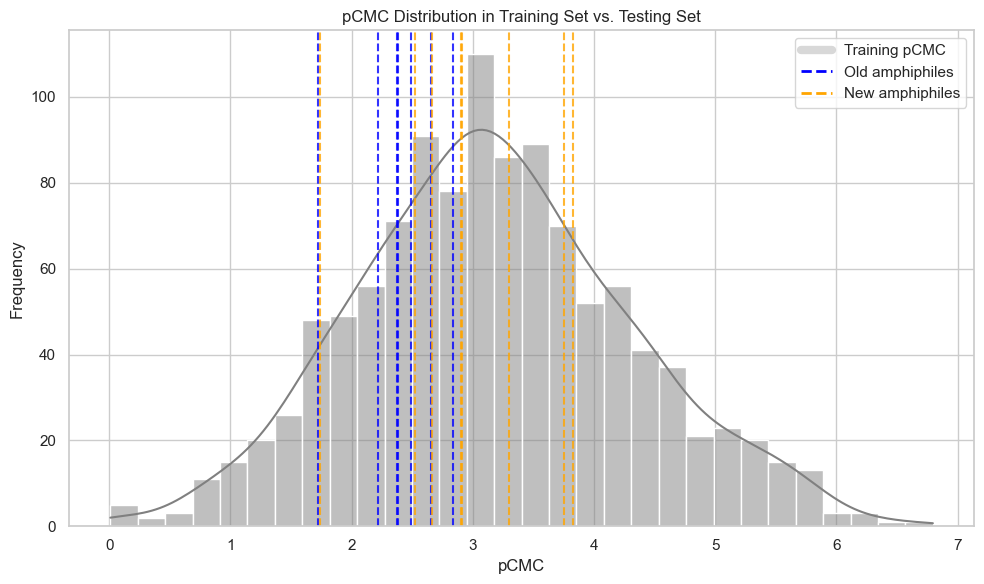

In [85]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set style
sns.set(style='whitegrid')

# Create figure
plt.figure(figsize=(10, 6))

# 1. Plot distribution of training data
sns.histplot(train_df_ori['pCMC'], bins=30, kde=True, color='gray', label='Training Set', alpha=0.5)

# 2. Overlay vertical lines for df_new1 (blue) and df_new2 (orange)
for val in df_new1['pCMC']:
    plt.axvline(val, color='blue', linestyle='--', alpha=0.8)

for val in df_new2['pCMC']:
    plt.axvline(val, color='orange', linestyle='--', alpha=0.8)

# Add legend (custom handles)
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], color='gray', lw=6, alpha=0.3, label='Training pCMC'),
    Line2D([0], [0], color='blue', linestyle='--', lw=2, label='Old amphiphiles'),
    Line2D([0], [0], color='orange', linestyle='--', lw=2, label='New amphiphiles')
]
plt.legend(handles=legend_elements)

# Labels
plt.xlabel('pCMC')
plt.ylabel('Frequency')
plt.title('pCMC Distribution in Training Set vs. Testing Set')

plt.tight_layout()
plt.show()
